<a href="https://colab.research.google.com/github/pazcalll/PCVK_Genap_2021/blob/main/finalProject.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

imported libraries

In [2]:
# import sys
import os
import cv2 as cv
import numpy as np
from google.colab.patches import cv2_imshow
from matplotlib import pyplot as plt

# from PIL import Image, ImageDraw
# from math import sqrt, pi, cos, sin
# from collections import defaultdict

In [3]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


Logic Goes Here

05_8_8.jpg
The number of the circles is : 4


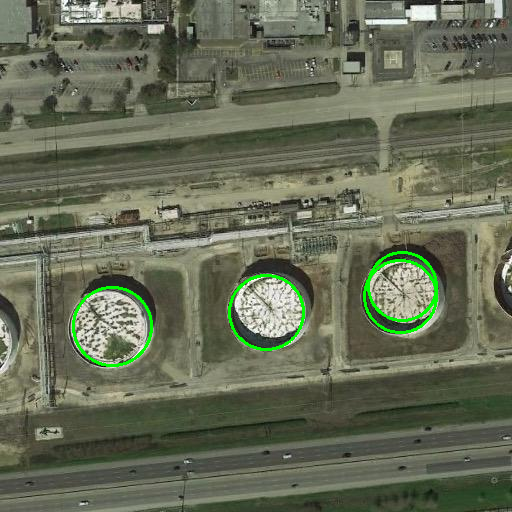

04_9_6.jpg
The number of the circles is : 1


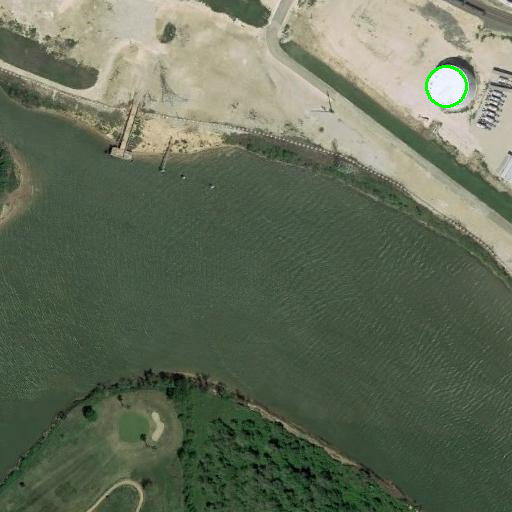

05_9_7.jpg
The number of the circles is : 1


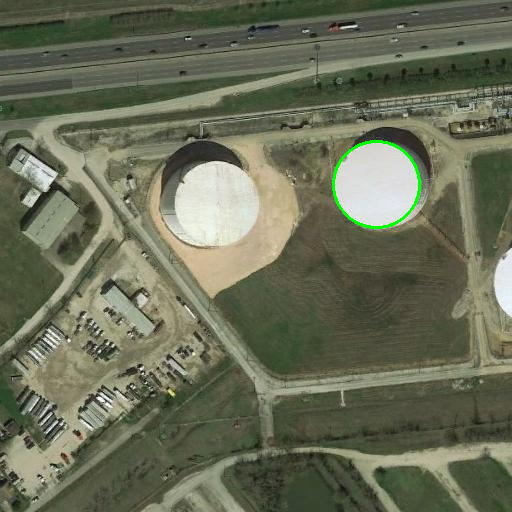

06_2_5.jpg
The number of the circles is : 6


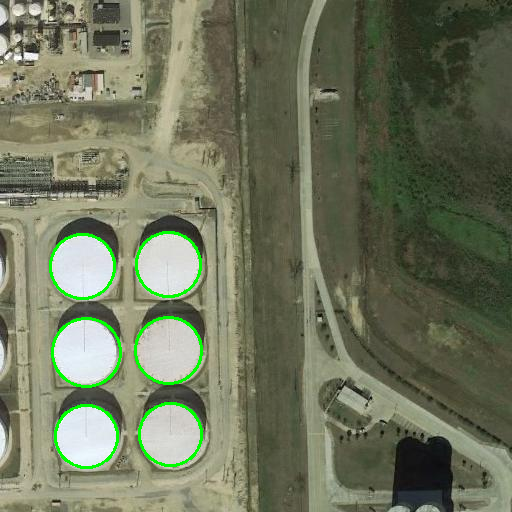

06_0_6.jpg
The number of the circles is : 9


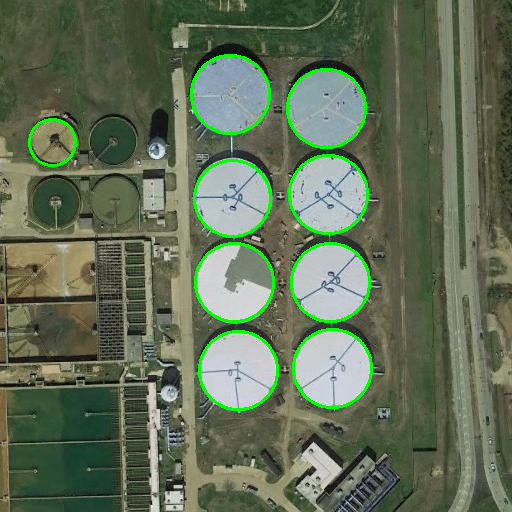

06_3_8.jpg
The number of the circles is : 10


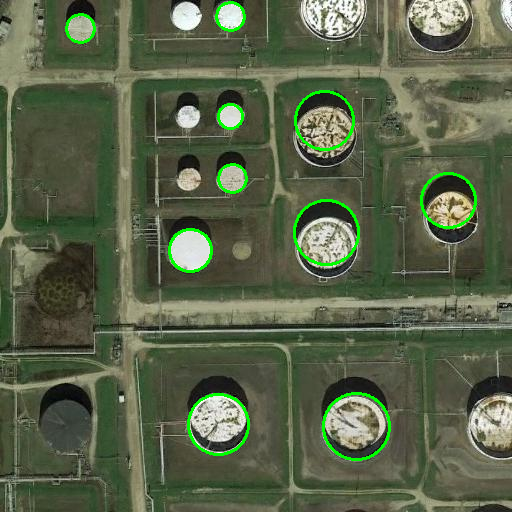

06_4_2.jpg
The number of the circles is : 4


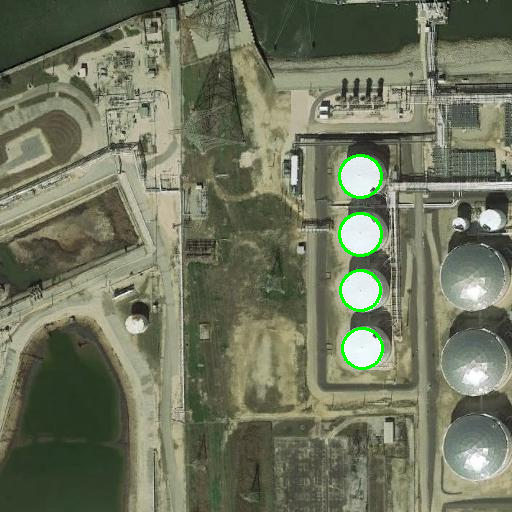

02_6_4.jpg
The number of the circles is : 2


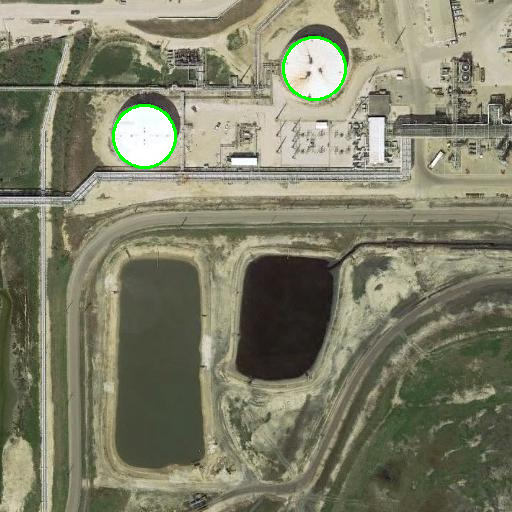

02_7_3.jpg
The number of the circles is : 2


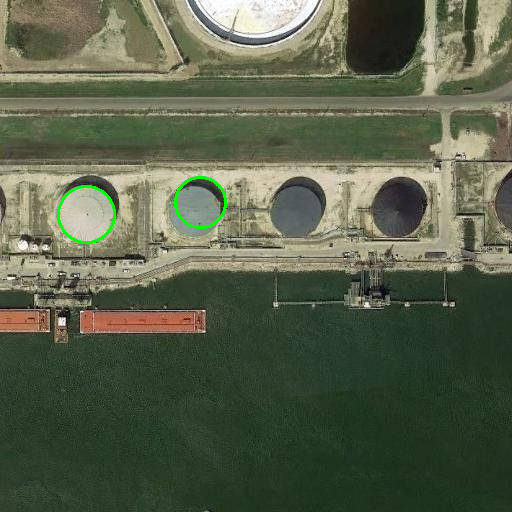

03_5_9.jpg
The number of the circles is : 4


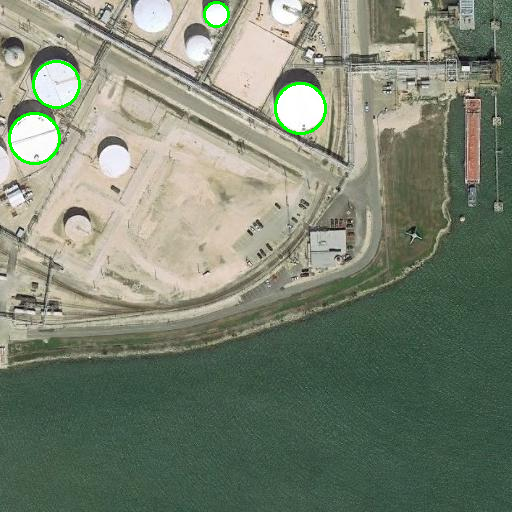

05_1_9.jpg
The number of the circles is : 14


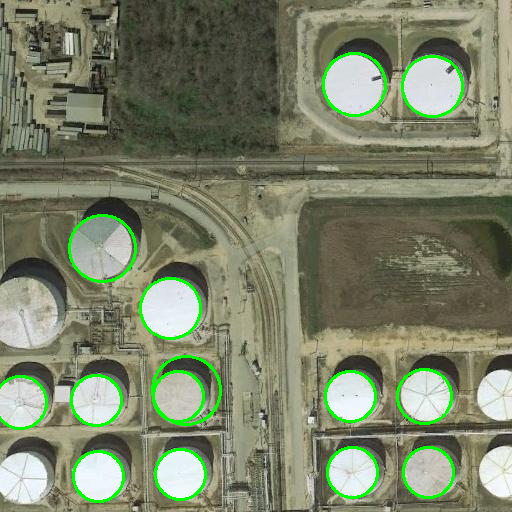

05_6_3.jpg
The number of the circles is : 3


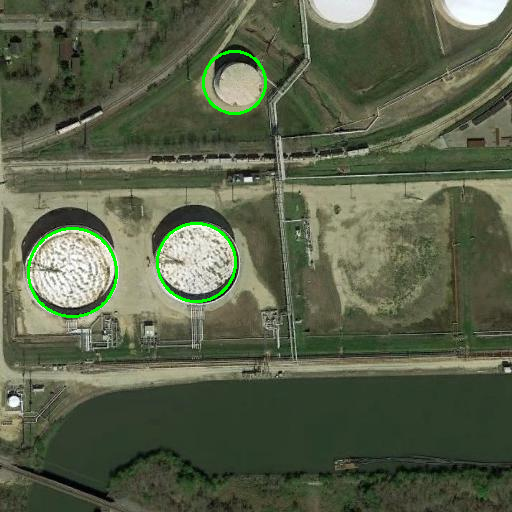

05_7_6.jpg
The number of the circles is : 1


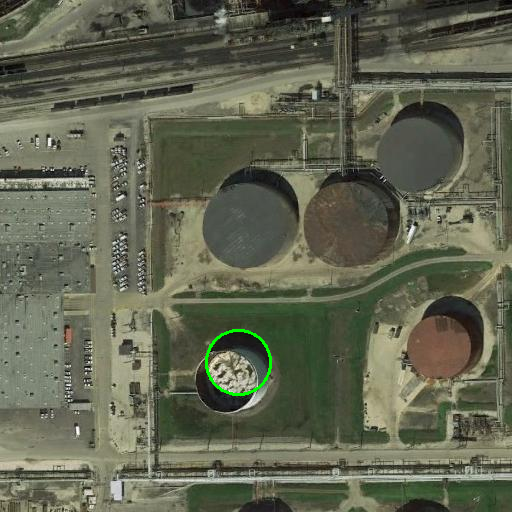

05_8_4.jpg
The number of the circles is : 2


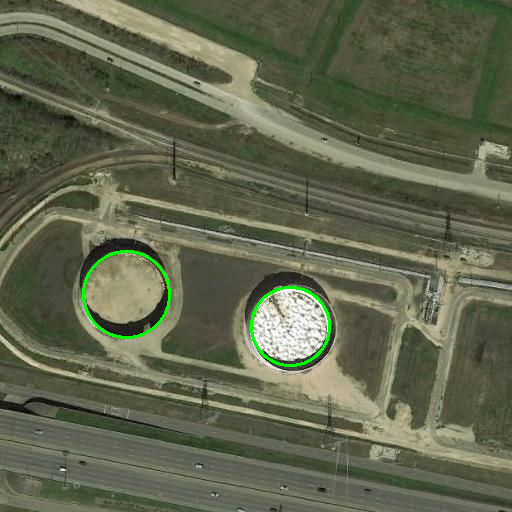

05_8_5.jpg
The number of the circles is : 5


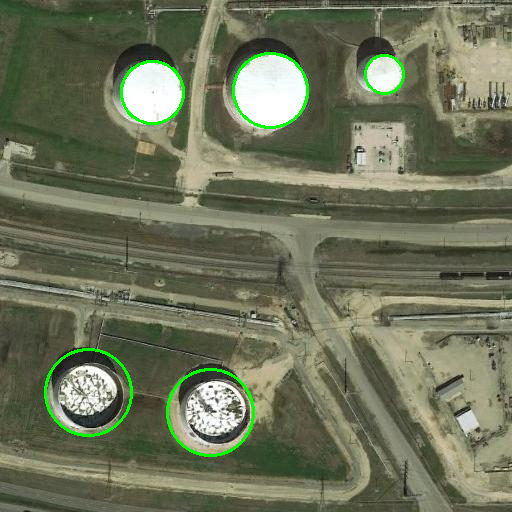

06_4_7.jpg
The number of the circles is : 2


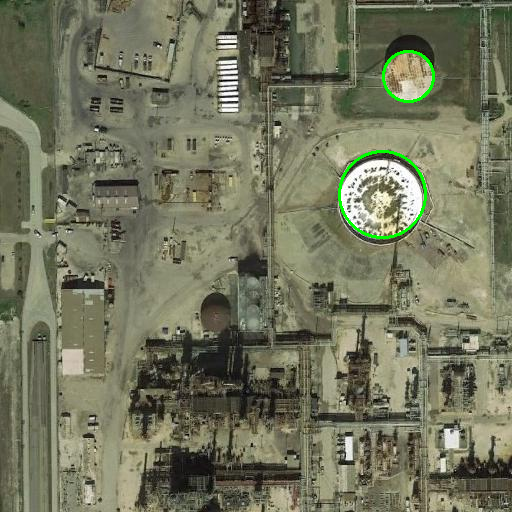

02_4_1.jpg
The number of the circles is : 8


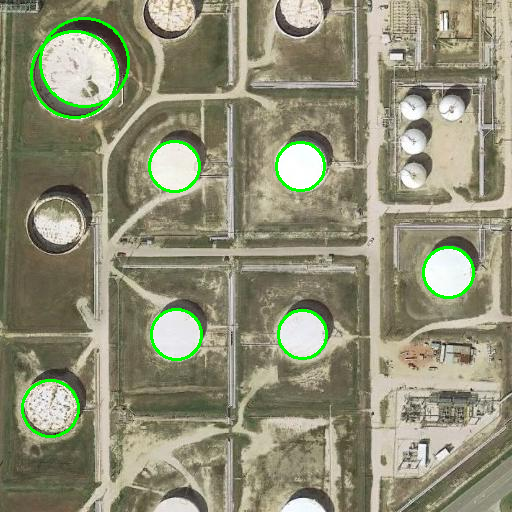

05_2_9.jpg
The number of the circles is : 16


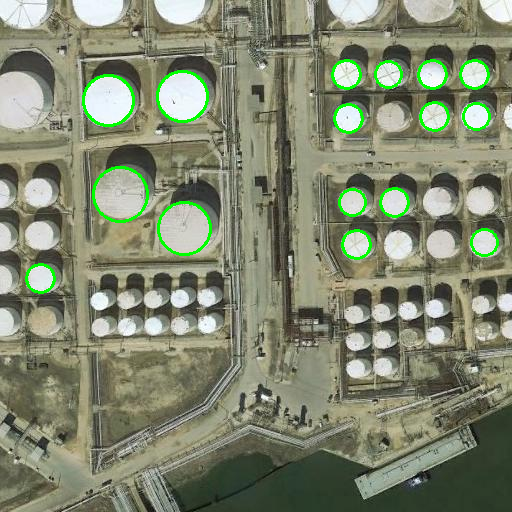

05_4_4.jpg
The number of the circles is : 5


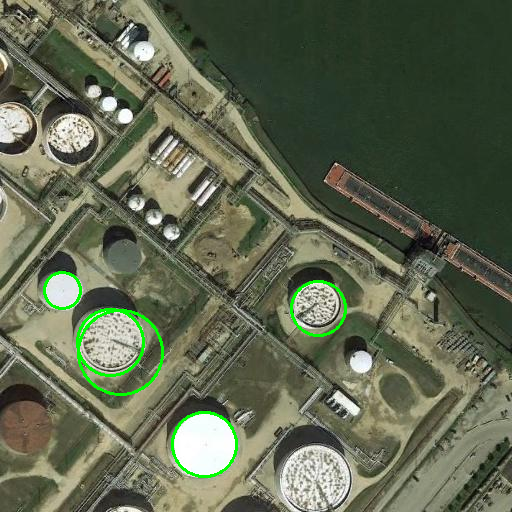

In [28]:
src = []
iterate = 0
for filename in os.listdir('/content/drive/MyDrive/PCVK/last/2-4toend/'):
      if filename.endswith("jpg"): 
          # Your code comes here such as 
          # print(filename)
          # filenames.append(filename)
          combine = {
              'filename': filename,
              'img' :  cv.imread('/content/drive/MyDrive/PCVK/last/2-4toend/'+filename, cv.IMREAD_COLOR),
          }
          src.append(combine)
          iterate=+1;



for combine in src:
  print(combine['filename'])
  img = combine['img']
  bil = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
  bil = cv.bilateralFilter(bil, 15, 60, 60)
  cimg = cv.medianBlur(bil,11)
  gray = cv.Canny(cimg, 11, 180)
  # gray = cv.Sobel(gray, cv.CV_64F, 1, 0, ksize=5)

  circles = cv.HoughCircles(cimg,cv.HOUGH_GRADIENT,1,10,
                          param1=60,param2=40,minRadius=10,maxRadius=50)
  fullcounter = 0
  circles = np.uint16(np.around(circles))
  for i in circles[0,:]:
    # draw the outer circle 
    fullcounter = fullcounter + 1
    cv.circle(img,(i[0],i[1]),i[2],(0,255,0),2)

  print("The number of the circles is :", fullcounter)
  cv2_imshow(img)


# img = cv.imread('/content/drive/MyDrive/PCVK/last/2-4toend/02_5_1.jpg')
# bil = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
# bil = cv.bilateralFilter(bil, 15, 50, 50)
# cimg = cv.medianBlur(bil,7)
# gray = cv.Canny(cimg, 11, 150, apertureSize = 3)
# gray = cv.Sobel(gray, cv.CV_64F, 1, 0, ksize=5)

# circles = cv.HoughCircles(cimg,cv.HOUGH_GRADIENT,1,10,
#                         param1=60,param2=40,minRadius=10,maxRadius=50)
# fullcounter = 0
# circles = np.uint16(np.around(circles))
# for i in circles[0,:]:
#   # draw the outer circle
#   fullcounter = fullcounter + 1
#   cv.circle(img,(i[0],i[1]),i[2],(0,255,0),3)

# print("The number of the circles is :", fullcounter)
# cv2_imshow(img)

In [35]:
from math import sqrt, atan2, pi
import numpy as np

def canny_edge_detector(input_image):
    input_pixels = input_image.load()
    width = input_image.width
    height = input_image.height

    # Transform the image to grayscale
    grayscaled = compute_grayscale(input_pixels, width, height)

    # Blur it to remove noise
    blurred = compute_blur(grayscaled, width, height)

    # Compute the gradient
    gradient, direction = compute_gradient(blurred, width, height)

    # Non-maximum suppression
    filter_out_non_maximum(gradient, direction, width, height)

    # Filter out some edges
    keep = filter_strong_edges(gradient, width, height, 20, 25)

    return keep


def compute_grayscale(input_pixels, width, height):
    grayscale = np.empty((width, height))
    for x in range(width):
        for y in range(height):
            pixel = input_pixels[x, y]
            grayscale[x, y] = (pixel[0] + pixel[1] + pixel[2]) / 3
    return grayscale


def compute_blur(input_pixels, width, height):
    # Keep coordinate inside image
    clip = lambda x, l, u: l if x < l else u if x > u else x

    # Gaussian kernel
    kernel = np.array([
        [1 / 256,  4 / 256,  6 / 256,  4 / 256, 1 / 256],
        [4 / 256, 16 / 256, 24 / 256, 16 / 256, 4 / 256],
        [6 / 256, 24 / 256, 36 / 256, 24 / 256, 6 / 256],
        [4 / 256, 16 / 256, 24 / 256, 16 / 256, 4 / 256],
        [1 / 256,  4 / 256,  6 / 256,  4 / 256, 1 / 256]
    ])

    # Middle of the kernel
    offset = len(kernel) // 2

    # Compute the blurred image
    blurred = np.empty((width, height))
    for x in range(width):
        for y in range(height):
            acc = 0
            for a in range(len(kernel)):
                for b in range(len(kernel)):
                    xn = clip(x + a - offset, 0, width - 1)
                    yn = clip(y + b - offset, 0, height - 1)
                    acc += input_pixels[xn, yn] * kernel[a, b]
            blurred[x, y] = int(acc)
    return blurred


def compute_gradient(input_pixels, width, height):
    gradient = np.zeros((width, height))
    direction = np.zeros((width, height))
    for x in range(width):
        for y in range(height):
            if 0 < x < width - 1 and 0 < y < height - 1:
                magx = input_pixels[x + 1, y] - input_pixels[x - 1, y]
                magy = input_pixels[x, y + 1] - input_pixels[x, y - 1]
                gradient[x, y] = sqrt(magx**2 + magy**2)
                direction[x, y] = atan2(magy, magx)
    return gradient, direction


def filter_out_non_maximum(gradient, direction, width, height):
    for x in range(1, width - 1):
        for y in range(1, height - 1):
            angle = direction[x, y] if direction[x, y] >= 0 else direction[x, y] + pi
            rangle = round(angle / (pi / 4))
            mag = gradient[x, y]
            if ((rangle == 0 or rangle == 4) and (gradient[x - 1, y] > mag or gradient[x + 1, y] > mag)
                    or (rangle == 1 and (gradient[x - 1, y - 1] > mag or gradient[x + 1, y + 1] > mag))
                    or (rangle == 2 and (gradient[x, y - 1] > mag or gradient[x, y + 1] > mag))
                    or (rangle == 3 and (gradient[x + 1, y - 1] > mag or gradient[x - 1, y + 1] > mag))):
                gradient[x, y] = 0


def filter_strong_edges(gradient, width, height, low, high):
    # Keep strong edges
    keep = set()
    for x in range(width):
        for y in range(height):
            if gradient[x, y] > high:
                keep.add((x, y))

    # Keep weak edges next to a pixel to keep
    lastiter = keep
    while lastiter:
        newkeep = set()
        for x, y in lastiter:
            for a, b in ((-1, -1), (-1, 0), (-1, 1), (0, -1), (0, 1), (1, -1), (1, 0), (1, 1)):
                if gradient[x + a, y + b] > low and (x+a, y+b) not in keep:
                    newkeep.add((x+a, y+b))
        keep.update(newkeep)
        lastiter = newkeep

    return list(keep)

src = []
filenames = []
iterate = 0
for filename in os.listdir('/content/drive/MyDrive/PCVK/last/2-4toend/'):
      if filename.endswith("jpg"): 
          # Your code comes here such as 
          # print(filename)
          # filenames.append(filename)
          combine = {
              'filename': filename,
              'img' :  Image.open('/content/drive/MyDrive/PCVK/last/2-4toend/'+filename),
          }
          src.append(combine)
          iterate=+1;

for combine in src:
  print(combine['filename'])
  # Load image:
  input_image = combine['img']
  
  # Output image:
  output_image = Image.new("RGB", input_image.size)
  output_image.paste(input_image)
  draw_result = ImageDraw.Draw(output_image)

  # Find circles
  rmin = 11
  rmax = 100
  steps = 100
  threshold = 0.60

  points = []
  for r in range(rmin, rmax + 1):
      for t in range(steps):
          points.append((r, int(r * cos(2 * pi * t / steps)), int(r * sin(2 * pi * t / steps))))

  acc = defaultdict(int)
  for x, y in canny_edge_detector(input_image):
      for r, dx, dy in points:
          a = x - dx
          b = y - dy
          acc[(a, b, r)] += 1

  circles = []
  counter = 0
  for k, v in sorted(acc.items(), key=lambda i: -i[1]):
      x, y, r = k
      if v / steps >= threshold and all((x - xc) ** 2 + (y - yc) ** 2 > rc ** 2 for xc, yc, rc in circles):
          # print(v / steps, x, y, r)
          circles.append((x, y, r))
          counter = counter + 1

  for x, y, r in circles:
      draw_result.ellipse((x-r, y-r, x+r, y+r), outline=(255,0,0,0))
  
  open_cv_image = np.array(output_image) 
  # Convert RGB to BGR 
  open_cv_image = open_cv_image[:, :, ::-1].copy() 

  cv2_imshow(open_cv_image)
  # plt.figure(figsize=(8, 8))
  # plt.imshow(output_image)
  print("The number of the circles is : ",counter)

05_8_8.jpg


KeyboardInterrupt: ignored

In [ ]:
# Load image:
input_image = Image.open("/content/drive/MyDrive/PCVK/last/06_0_6.jpg")

# Output image:
output_image = Image.new("RGB", input_image.size)
output_image.paste(input_image)
draw_result = ImageDraw.Draw(output_image)
output_image.show()
# Find circles
rmin = 15
rmax = 100
steps = 100
threshold = 0.55

points = []
for r in range(rmin, rmax + 1):
    for t in range(steps):
        points.append((r, int(r * cos(2 * pi * t / steps)), int(r * sin(2 * pi * t / steps))))

acc = defaultdict(int)
for x, y in canny_edge_detector(input_image):
    for r, dx, dy in points:
        a = x - dx
        b = y - dy
        acc[(a, b, r)] += 1

circles = []
counter=0
for k, v in sorted(acc.items(), key=lambda i: -i[1]):
    x, y, r = k
    if v / steps >= threshold and all((x - xc) ** 2 + (y - yc) ** 2 > rc ** 2 for xc, yc, rc in circles):
        # print(v / steps, x, y, r)
        counter = counter + 1
        circles.append((x, y, r))

for x, y, r in circles:
    draw_result.ellipse((x-r, y-r, x+r, y+r), outline=(255,0,0,0))

print(counter)
plt.figure(figsize=(8, 8))
plt.imshow(output_image)
